### Important Libraries

In [1]:
import pandas as pd
print(pd.__version__)
import numpy as np
print(np.__version__)
import matplotlib.pyplot as plt
import seaborn as sns
import xgboost as xg
from sklearn.svm import OneClassSVM
from sklearn.model_selection import train_test_split
from sklearn.metrics import mean_squared_error as MSE
from sklearn.model_selection import GridSearchCV
from sklearn.metrics import confusion_matrix, accuracy_score
from sklearn.inspection import permutation_importance

2.0.2
1.23.5


In [23]:
# check xgboost version
data_path = "..\Data\Final_Well_Block_Data_1.csv"
df = pd.read_csv(data_path)
print("\nLoaded Data :", data_path, "\n----------------------------------------------")
print("\n","\n",df.head())
thres = 1000


Loaded Data : ..\Data\Final_Well_Block_Data_1.csv 
----------------------------------------------

 
    Well        mTVDSS  ANGLE_FAIL.DEG                  :  Fail Angle  \
0    105  2795.135390                                         41.473   
1    105  2800.650663                                         42.762   
2    105  2807.395851                                         41.913   
3    105  2814.086270                                         42.630   
4    105  2820.730553                                         40.113   

   BRIT_IND.                     :  Brittleness Index  \
0                                             72.563    
1                                             77.234    
2                                             70.998    
3                                             72.064    
4                                             59.425    

   CS   .M/MIN                 :  Compressive Strength  \
0                                           1281.981     
1    

### Visualizing Dataset

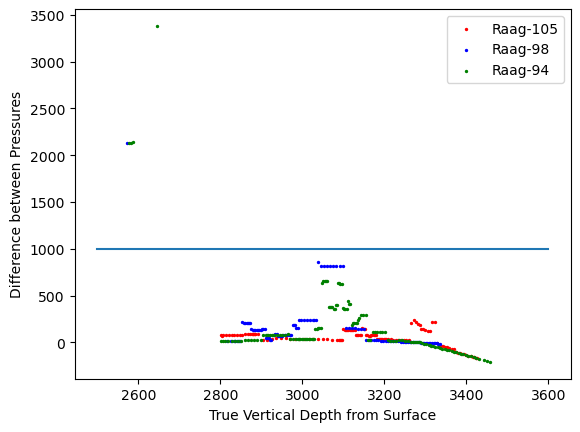

In [24]:
well_name = [[2,119],[331,445],[446,581]]#[[2,119],[120,213],[214,330],[331,445],[446,581]]
diff_list = []
color_l = ['red','blue','green']#['red','blue','green','yellow','black']
well = ['Raag-105','Raag-98','Raag-94']#['Raag-105','Raag-106','Raag-107','Raag-98','Raag-94']
i=0
for start,end in well_name:
    diff, depth = df.iloc[start-1:end,-2]-df.iloc[start-1:end,-1], df.iloc[start-1:end,1]
    new_diff = [depth, diff, color_l[i], well[i]]
    diff_list.append(new_diff)
    i+=1
for depth, diff, color_n, well in diff_list:
    plt.scatter(depth, diff, color = color_n, s=2, label = well)
    plt.xlabel('True Vertical Depth from Surface')
    plt.ylabel('Difference between Pressures')
x = [2500,3600]
y = [thres,thres]
plt.plot(x,y)
plt.legend()

In [25]:
press_diff = []
i = 0  
j = 0
for check in df['PRESS_PP.PSI                  :  Pore Pressure']-df['Well Block Pressure (psi)']:
    if(check>thres):
        press_diff.append(1)
        i+=1
    else:
        press_diff.append(0)
        j+=1
print(press_diff)
print('number of Depleted', i)
print('number of Normal Zones', j)
df.drop(['Well Block Pressure (psi)'], axis=1)
df['Depletion'] = press_diff

[0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 

In [26]:
df.head(20)

,Well,mTVDSS,ANGLE_FAIL.DEG : Fail Angle,BRIT_IND. : Brittleness Index,CS .M/MIN : Compressive Strength,DTCO .US/F : Compressional slowness,DTSM .US/F : Fast Shear Slowness,IP .RAYL/M2 : P Impedence,IS .RAYL/M2 : S Impedance,KBULK. : Bulk Mudulus,...,STRESS_CUM.PSI : Cumulative stress (SHPZ),UCS_BF.PSI : Uniaxial Compressive Strength (BF),VP .FT/S : Compressional velocity,VPVS . : Vp / Vs ratio,VS .FT/S : Shear velocity,YM . : Youngs' Modulus,YM_STAT. : Youngs' Modulus (Static),PRESS_PP.PSI : Pore Pressure,Well Block Pressure (psi),Depletion
0,105,2795.135390,41.473,72.563,1281.981,61.927,105.249,11979.925,7048.858,18.137,...,8997.416,3240.794,16147.993,1.700,9501.305,7.314,4.883,5107.361,5033.659180,0
1,105,2800.650663,42.762,77.234,1341.285,58.283,100.553,12970.554,7518.021,22.254,...,10488.797,3744.189,17157.750,1.725,9945.014,8.243,5.728,5110.932,5036.105469,0
2,105,2807.395851,41.913,70.998,1301.960,60.666,104.956,12198.621,7050.998,20.335,...,10563.284,3296.255,16483.615,1.730,9527.793,7.420,4.976,5115.263,5039.099609,0
3,105,2814.086270,42.630,72.064,1335.093,58.650,102.499,12484.204,7143.443,22.395,...,11494.078,3469.307,17050.414,1.748,9756.221,7.743,5.267,5119.555,5042.071289,0
4,105,2820.730553,40.113,59.425,1221.895,65.936,119.887,12668.450,6967.448,23.134,...,11619.654,2870.961,15166.269,1.818,8341.209,6.593,4.263,5123.810,5045.024414,0
5,105,2827.334950,40.225,62.202,1226.751,65.599,116.571,12256.762,6897.378,20.880,...,11536.380,2891.730,15244.065,1.777,8578.456,6.635,4.297,5127.931,5047.961426,0
6,105,2833.906009,37.231,39.789,1102.140,75.005,143.753,10773.809,5621.409,19.943,...,12480.913,1916.809,13332.355,1.917,6956.372,4.540,2.662,5132.016,5050.885742,0
7,105,2840.449387,39.028,57.828,1175.655,69.257,123.658,11974.522,6706.618,19.638,...,10265.172,2626.834,14438.890,1.786,8086.847,6.097,3.853,5136.065,5053.800293,0
8,105,2846.971333,36.395,40.959,1069.133,77.789,141.958,9256.819,5072.488,14.489,...,10891.847,1715.719,12855.304,1.825,7044.361,4.061,2.324,5140.078,5056.706543,0
9,105,2853.476908,41.665,71.346,1290.670,61.375,107.492,12995.516,7420.023,22.459,...,10737.270,3434.588,16293.385,1.751,9303.000,7.679,5.208,5143.962,5059.607910,0


In [27]:
df = df.drop(['Well Block Pressure (psi)'], axis=1)

In [28]:
df_max_scaled = df.copy()
i = 0  
# apply normalization techniques
for column in df_max_scaled.iloc[:,1:-1].columns:
        df_max_scaled[column] = df_max_scaled[column]  / df_max_scaled[column].abs().max()
      
# ## view normalized data
display(df_max_scaled)

,Well,mTVDSS,ANGLE_FAIL.DEG : Fail Angle,BRIT_IND. : Brittleness Index,CS .M/MIN : Compressive Strength,DTCO .US/F : Compressional slowness,DTSM .US/F : Fast Shear Slowness,IP .RAYL/M2 : P Impedence,IS .RAYL/M2 : S Impedance,KBULK. : Bulk Mudulus,...,PZS .PSI : Processed Zone Stress,STRESS_CUM.PSI : Cumulative stress (SHPZ),UCS_BF.PSI : Uniaxial Compressive Strength (BF),VP .FT/S : Compressional velocity,VPVS . : Vp / Vs ratio,VS .FT/S : Shear velocity,YM . : Youngs' Modulus,YM_STAT. : Youngs' Modulus (Static),PRESS_PP.PSI : Pore Pressure,Depletion
0,105,0.793163,0.041504,0.545267,0.825238,0.061973,0.413672,0.635233,0.696028,0.018151,...,0.447322,0.573671,0.504677,0.765055,0.669819,0.777754,0.586058,0.477789,0.952990,0
1,105,0.794728,0.042794,0.580366,0.863413,0.058327,0.395215,0.687761,0.742355,0.022271,...,0.626061,0.668761,0.583069,0.812895,0.679669,0.814075,0.660497,0.560470,0.953656,0
2,105,0.796642,0.041944,0.533507,0.838098,0.060712,0.412521,0.646829,0.696240,0.020350,...,0.629654,0.673510,0.513313,0.780956,0.681639,0.779922,0.594551,0.486888,0.954464,0
3,105,0.798540,0.042662,0.541517,0.859427,0.058694,0.402864,0.661972,0.705368,0.022412,...,0.739132,0.732857,0.540262,0.807809,0.688731,0.798621,0.620433,0.515362,0.955265,0
4,105,0.800426,0.040143,0.446543,0.786559,0.065985,0.471206,0.671742,0.687990,0.023151,...,0.699958,0.740864,0.447084,0.718543,0.716312,0.682791,0.528285,0.417123,0.956059,0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
1296,102,0.926454,0.040067,0.463503,0.784453,0.066214,0.457422,0.622720,0.659273,0.019143,...,0.385840,0.657639,0.431901,0.716067,0.693065,0.703366,0.512580,0.401076,0.992971,0
1297,102,0.928337,0.041344,0.457198,0.820603,0.062437,0.454796,0.702575,0.705439,0.027114,...,0.571862,0.789354,0.484795,0.759377,0.730890,0.707424,0.566426,0.456849,0.993290,0
1298,102,0.930218,0.037967,0.415095,0.727845,0.072757,0.492807,0.536493,0.579297,0.013905,...,0.237290,0.572722,0.340808,0.651670,0.679669,0.652860,0.413301,0.304990,0.993595,0
1299,102,0.932098,0.041592,0.478028,0.827782,0.061721,0.447254,0.719873,0.726572,0.027696,...,0.476817,0.743538,0.510613,0.768183,0.726950,0.719355,0.591907,0.484051,0.993899,0


### Visualizing Data

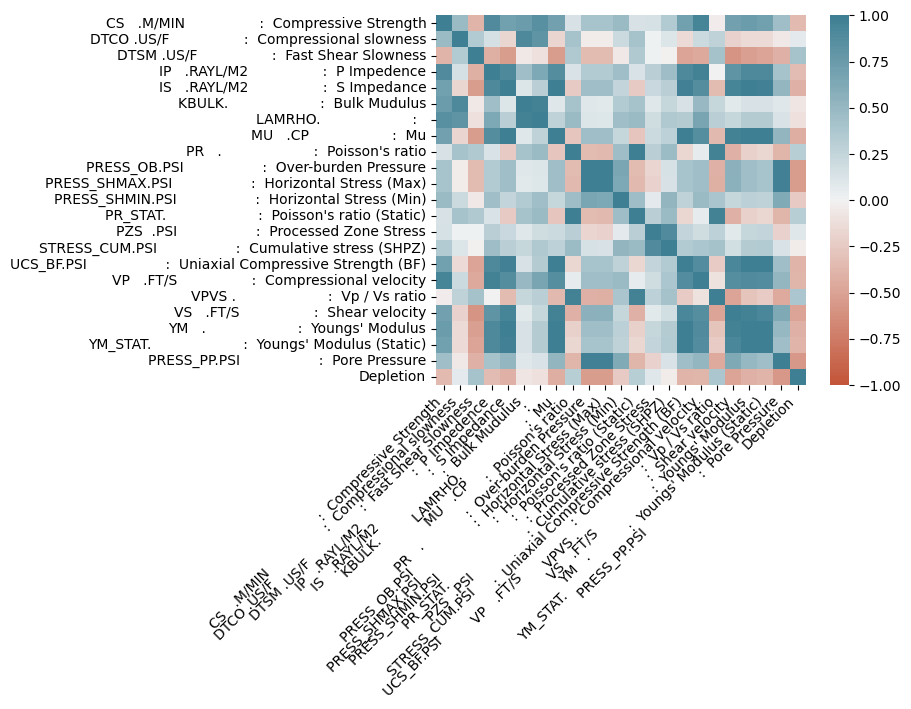

In [29]:
data = df_max_scaled.iloc[:,4:]
corr = data.corr()
ax = sns.heatmap(
    corr, 
    vmin=-1, vmax=1, center=0,
    cmap=sns.diverging_palette(20, 220, n=200),
    square=True
)
ax.set_xticklabels(
    ax.get_xticklabels(),
    rotation=45,
    horizontalalignment='right'
);

In [30]:
# number of fraud cases
depleted = len(df_max_scaled[df_max_scaled.Depletion == 1])
# selecting the indices of the non-fraud classes
depleted_indices = df_max_scaled[df_max_scaled.Depletion == 1].index
non_depleted_indices = df_max_scaled[df_max_scaled.Depletion == 0].index
# from all non-fraud observations, randomly select observations equal to number of fraud observations
random_non_depleted_indices = np.random.choice(non_depleted_indices, depleted, replace = False)
random_non_depleted_indices = np.array(random_non_depleted_indices)
# appending the 2 indices
under_sample_indices = np.concatenate([depleted_indices,random_non_depleted_indices])
# undersample dataset
under_sample_data = df_max_scaled.iloc[under_sample_indices,1:]
# now split X, y variables from the under sample data
X_undersample = under_sample_data.loc[:, under_sample_data.columns != 'Depletion']
y_undersample = under_sample_data.loc[:, under_sample_data.columns == 'Depletion']
display(X_undersample)
y_undersample

,mTVDSS,ANGLE_FAIL.DEG : Fail Angle,BRIT_IND. : Brittleness Index,CS .M/MIN : Compressive Strength,DTCO .US/F : Compressional slowness,DTSM .US/F : Fast Shear Slowness,IP .RAYL/M2 : P Impedence,IS .RAYL/M2 : S Impedance,KBULK. : Bulk Mudulus,LAMRHO. :,...,PR_STAT. : Poisson's ratio (Static),PZS .PSI : Processed Zone Stress,STRESS_CUM.PSI : Cumulative stress (SHPZ),UCS_BF.PSI : Uniaxial Compressive Strength (BF),VP .FT/S : Compressional velocity,VPVS . : Vp / Vs ratio,VS .FT/S : Shear velocity,YM . : Youngs' Modulus,YM_STAT. : Youngs' Modulus (Static),PRESS_PP.PSI : Pore Pressure
444,0.729975,0.030024,0.201280,0.539055,0.000000,0.000000,0.388284,0.387639,0.009348,0.022816,...,0.732970,0.414001,0.563296,0.166908,0.466332,0.734831,0.431946,0.190545,0.121722,0.922122
445,0.731422,0.029984,0.190445,0.538203,0.000000,0.000000,0.386562,0.381589,0.009572,0.023296,...,0.746594,0.413014,0.569444,0.163843,0.465596,0.743499,0.426424,0.186058,0.118493,0.922921
446,0.732863,0.029484,0.190340,0.527413,0.000000,0.000000,0.381541,0.378337,0.009152,0.022432,...,0.741144,0.396134,0.560615,0.160591,0.456342,0.739953,0.419839,0.181250,0.114971,0.923691
447,0.734298,0.029799,0.209479,0.534192,0.000000,0.000000,0.387455,0.390872,0.008981,0.022071,...,0.716621,0.380477,0.546140,0.167573,0.462140,0.727344,0.432556,0.191506,0.122407,0.924481
580,0.750733,0.030364,0.108568,0.546481,0.100284,0.835496,0.403038,0.353814,0.012854,0.032120,...,0.874659,0.838931,0.836608,0.147708,0.472790,0.835697,0.385082,0.162099,0.101468,0.933136
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
139,0.837713,0.037892,0.479816,0.725873,0.073000,0.476708,0.562775,0.630298,0.012275,0.031178,...,0.531335,0.661441,0.685530,0.376810,0.649501,0.655240,0.674911,0.453606,0.342955,0.970467
884,0.907665,0.042171,0.539623,0.844758,0.060072,0.417516,0.705063,0.741940,0.024416,0.063939,...,0.651226,0.616533,0.758983,0.554729,0.789276,0.697400,0.770594,0.634135,0.530626,0.989446
336,0.808374,0.042504,0.512271,0.854689,0.059134,0.428660,0.750140,0.756850,0.030154,0.082700,...,0.716621,0.693324,0.753382,0.564608,0.801792,0.727344,0.750559,0.643429,0.540998,0.959392
1293,0.920801,0.039861,0.471242,0.778735,0.066838,0.459222,0.628890,0.669450,0.018768,0.048775,...,0.632153,0.597348,0.748356,0.436004,0.709372,0.689125,0.700606,0.516907,0.405382,0.991980


,Depletion
444,1
445,1
446,1
447,1
580,1
...,...
139,0
884,0
336,0
1293,0


In [32]:
train_X, test_X, train_y, test_y = train_test_split(X_undersample, y_undersample,
                      test_size = 0.1, random_state = 123)
print("\n", train_X.head(), "\n", test_X.head(), "\n\n\n", train_y.head(), "\n", test_y.head())


         mTVDSS  ANGLE_FAIL.DEG                  :  Fail Angle  \
335   0.807239                                       0.041710   
585   0.756248                                       0.032265   
1125  0.964266                                       0.041701   
740   0.962893                                       0.042228   
773   0.758207                                       0.030344   

      BRIT_IND.                     :  Brittleness Index  \
335                                            0.424931    
585                                            0.204098    
1125                                           0.545244    
740                                            0.548024    
773                                            0.109207    

      CS   .M/MIN                 :  Compressive Strength  \
335                                            0.831242     
585                                            0.588872     
1125                                           0.830958     
74

In [33]:
# train_dmatrix = xg.DMatrix(data = train_X, label = train_y)
# test_dmatrix = xg.DMatrix(data = test_X, label = test_y)

In [34]:
# Define the hyperparameter grid
param_grid = {
    'max_depth': [3, 5, 7],
    'learning_rate': [0.1, 0.01, 0.001],
    'subsample': [0.5, 0.7, 1]
}

# Create the XGBoost model object
xgb_model = xg.XGBClassifier()

# Create the GridSearchCV object
grid_search = GridSearchCV(xgb_model, param_grid, cv=5, scoring='accuracy')

# Fit the GridSearchCV object to the training data
grid_search.fit(train_X, train_y)

# Print the best set of hyperparameters and the corresponding score
print("Best set of hyperparameters: ", grid_search.best_params_)
print("Best score: ", grid_search.best_score_)

Best set of hyperparameters:  {'learning_rate': 0.1, 'max_depth': 7, 'subsample': 0.5}
Best score:  0.8074770091963217


In [38]:
xgb_model = xg.XGBClassifier(learning_rate = 0.1, max_depth = 7, subsample = 0.5)
xgb_model.fit(train_X, train_y)

XGBClassifier(base_score=None, booster=None, callbacks=None,
              colsample_bylevel=None, colsample_bynode=None,
              colsample_bytree=None, early_stopping_rounds=None,
              enable_categorical=False, eval_metric=None, feature_types=None,
              gamma=None, gpu_id=None, grow_policy=None, importance_type=None,
              interaction_constraints=None, learning_rate=0.1, max_bin=None,
              max_cat_threshold=None, max_cat_to_onehot=None,
              max_delta_step=None, max_depth=7, max_leaves=None,
              min_child_weight=None, missing=nan, monotone_constraints=None,
              n_estimators=100, n_jobs=None, num_parallel_tree=None,
              predictor=None, random_state=None, ...)

In [39]:
pred = xgb_model.predict(test_X)
accuracy = accuracy_score(test_y, pred)
accuracy

0.855072463768116

In [40]:
pred_train = xgb_model.predict(train_X)
accuracy = accuracy_score(train_y, pred_train)
accuracy

0.9836867862969005

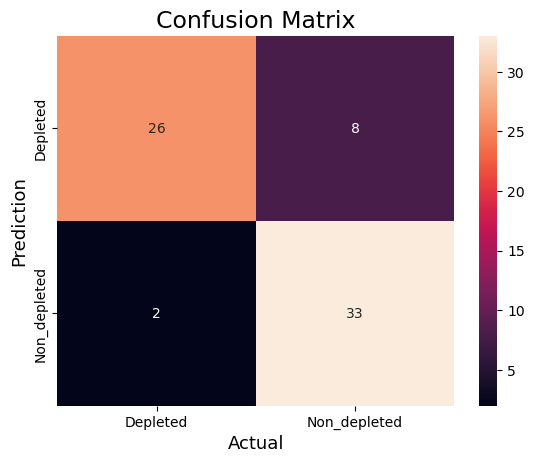

In [41]:
cm = confusion_matrix(test_y,pred)
 
#Plot the confusion matrix.
sns.heatmap(cm,
            annot=True,
            fmt='g',
            xticklabels=['Depleted','Non_depleted'],
            yticklabels=['Depleted','Non_depleted'])
plt.ylabel('Prediction',fontsize=13)
plt.xlabel('Actual',fontsize=13)
plt.title('Confusion Matrix',fontsize=17)
plt.show()

In [42]:
xgb_model.get_booster().get_score(importance_type="gain")
# xgb_model.feature_importances_

{'mTVDSS': 2.8416457176208496,
 'ANGLE_FAIL.DEG                  :  Fail Angle': 1.540607213973999,
 'BRIT_IND.                     :  Brittleness Index': 1.9145848751068115,
 'CS   .M/MIN                 :  Compressive Strength': 0.8589664101600647,
 'DTCO .US/F                 :  Compressional slowness': 1.8461990356445312,
 'DTSM .US/F                 :  Fast Shear Slowness': 3.0914807319641113,
 'IP   .RAYL/M2                 :  P Impedence': 1.466986894607544,
 'IS   .RAYL/M2                 :  S Impedance': 2.2076926231384277,
 'KBULK.                     :  Bulk Mudulus': 1.1764366626739502,
 'LAMRHO.                     :  ': 1.7892478704452515,
 'MU   .CP                   :  Mu': 1.6546351909637451,
 "PR   .                     :  Poisson's ratio": 1.5879327058792114,
 'PRESS_OB.PSI                  :  Over-burden Pressure': 4.457489967346191,
 'PRESS_SHMAX.PSI                  :  Horizontal Stress (Max)': 6.299075126647949,
 'PRESS_SHMIN.PSI                  :  Horizontal St

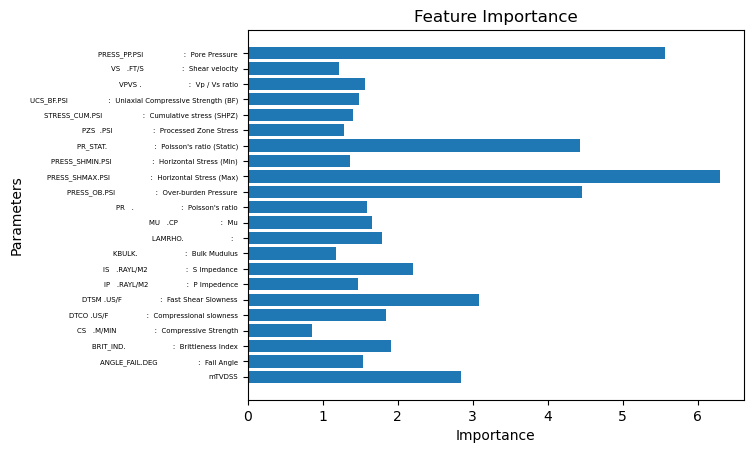

In [43]:
feature_importance = xgb_model.get_booster().get_score(importance_type="gain")
# list_features = ['mTVDSS','Northing', 'Easting','ANGLE_FAIL.DEG                  :  Fail Angle','BRIT_IND.                     :  Brittleness Index','BRIT_PR.                     :  Brittleness Index from Poisson\'s Ratio', 'BRIT_YM.                     :  Brittleness Index from Young\'s Modulus','CS   .M/MIN                 :  Compressive Strength','DTCO .US/F                 :  Compressional slowness','DTSM .US/F                 :  Fast Shear Slowness','IP   .RAYL/M2                 :  P Impedence','IS   .RAYL/M2                 :  S Impedance','KBULK.                     :  Bulk Mudulus','LAMBDA.                     :  Lambda','LAMRHO.                     :  ','MU   .CP                   :  Mu','PR   .                     :  Poisson\'s ratio','PRESS_OB.PSI                  :  Over-burden Pressure','PRESS_SHMAX.PSI                  :  Horizontal Stress (Max)','PRESS_SHMIN.PSI                  :  Horizontal Stress (Min)','PR_STAT.                     :  Poisson\'s ratio (Static)','PZS  .PSI                  :  Processed Zone Stress','SHMAX_GRAD.                     :  Horizontal Stress Gradient (Max)','SHMIN_GRAD.                     :  Horizontal Stress Gradient (Min)','STRESS_CUM.PSI                  :  Cumulative stress (SHPZ)','UCS_BF.PSI                  :  Uniaxial Compressive Strength (BF)','UCS_LAL.PSI                  :  Uniaxial Compressive Strength (lal)','VP   .FT/S                 :  Compressional velocity','VPVS .                     :  Vp / Vs ratio','VS   .FT/S                 :  Shear velocity','YM   .                     :  Youngs\' Modulus','YM_STAT.                     :  Youngs\' Modulus (Static)', 'PRESS_PP.PSI                  :  Pore Pressure']
 
# getting values against each value of y
# x=list(feature_importance)
# plt.barh(list_features, x)
y=list(feature_importance.keys())
 
# getting values against each value of y
x=list(feature_importance.values())
plt.barh(y, x)
# setting label of y-axis
plt.ylabel("Parameters")
plt.yticks(fontsize = 5) 
# setting label of x-axis
plt.xlabel("Importance")
plt.title("Feature Importance")
plt.show()

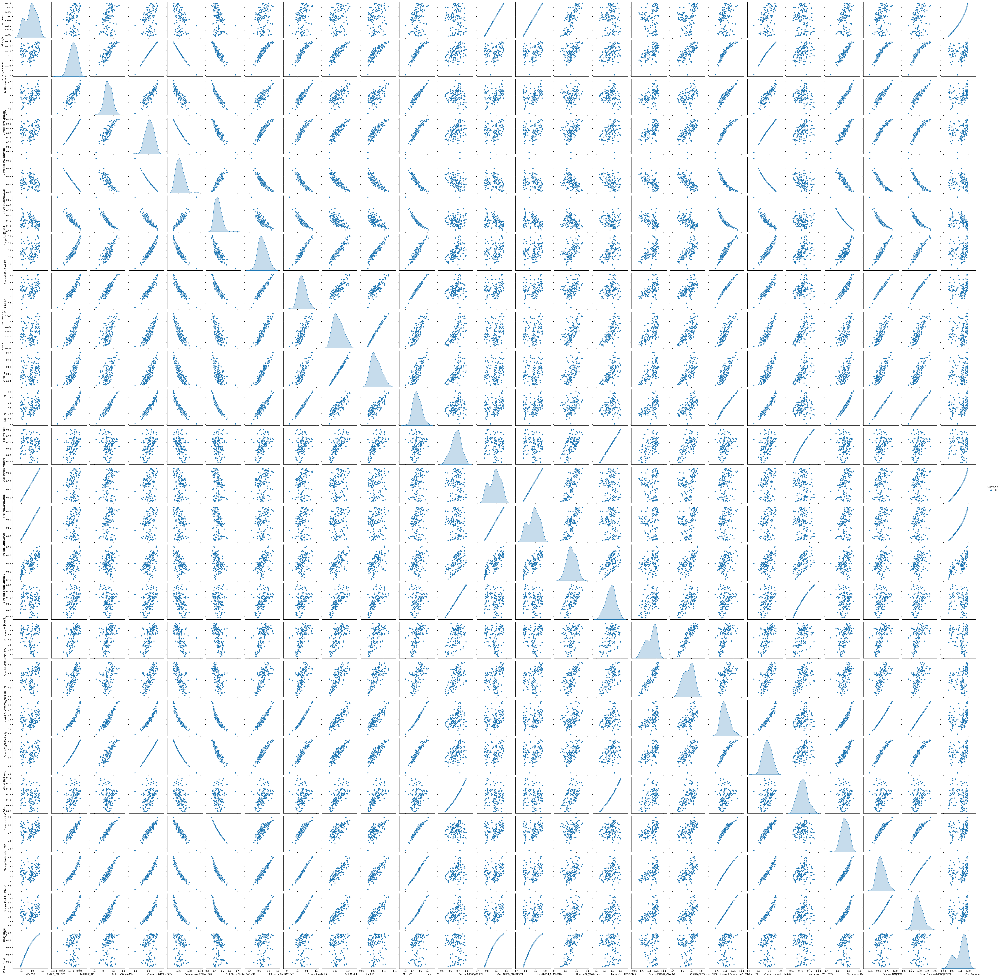

In [45]:
df_sns = df_max_scaled.iloc[:121, 1:]
sns.pairplot(data=df_sns, hue='Depletion')